In [1]:
from dicom_dataset import get_splitted_dataloaders

import numpy as np
import matplotlib.pyplot as plt
from einops import rearrange

device = "cuda:2"

from glob import glob
len(glob("../scrap/physionet.org/files/mimic-cxr/2.0.0/files/p*/*")), len(glob("preprocessed_data/xcr/p*/*"))

(13023, 7435)

In [2]:
import transformers
config = transformers.ViTConfig(
    architectures= ["ViTModel"],
    attention_probs_dropout_prob= 0.0,
    encoder_stride= 32,
    hidden_act= "gelu",
    hidden_dropout_prob= 0.0,
    hidden_size= 256,
    image_size= 224,
    initializer_range= 0.02,
    intermediate_size= 512,
    layer_norm_eps= 1e-12,
    model_type= "vit",
    num_attention_heads= 8,
    num_channels= 1,
    num_hidden_layers= 6,
    patch_size= 32,
    qkv_bias= True,
    transformers_version= "4.30.2"
)

In [3]:
from models.InViT import InViT

model = InViT(config, do_global_reconstruction=True).to(device)
model.train()
model.num_parameters()/1e6

4.522149

In [4]:
# import transformers
# from transformers import ViTForMaskedImageModeling

# model = ViTForMaskedImageModeling(transformers.ViTConfig(
#     architectures= ["ViTModel"],
#     attention_probs_dropout_prob= 0.0,
#     # encoder_stride= 16, essai 1
#     encoder_stride= 32,
#     hidden_act= "gelu",
#     hidden_dropout_prob= 0.0,
#     # hidden_size= 768, old de chez old
#     hidden_size= 256,
#     image_size= 224,
#     initializer_range= 0.02,
#     # intermediate_size= 3072, old de chez old
#     intermediate_size= 512,
#     layer_norm_eps= 1e-12,
#     model_type= "vit",
#     num_attention_heads= 8,
#     # num_channels= 3, old de chez old
#     num_channels= 1,
#     num_hidden_layers= 6,
#     # num_hidden_layers= 12, old de chez old
#     # patch_size= 16, essai 1
#     patch_size= 32,
#     qkv_bias= True,
#     transformers_version= "4.30.2"
# )).to(device)
# model.train()
# model.num_parameters()/1e6

In [5]:
import torch
from torch import nn
from transformers import get_cosine_schedule_with_warmup, get_cosine_with_hard_restarts_schedule_with_warmup
import math

batchSize = 128
epochs = 501
warmup_epochs = 100
# warmup_epochs = 0
base_lr = 1e-4
mask_ratio = 0.7
num_patches = (model.config.image_size // model.config.patch_size) ** 2
patch_width = model.config.image_size // model.config.patch_size

train_dl, valid_dl, _ = get_splitted_dataloaders("preprocessed_data/xcr", device, batchSize)
# batch = next(iter(train_dl))

optimizer = torch.optim.Adam(model.parameters(), lr=base_lr)

n_sample = len(train_dl.dataset)
n_steps_per_epoch = math.ceil(n_sample/batchSize)
n_steps = n_steps_per_epoch * epochs
n_warmup_steps = n_steps_per_epoch * warmup_epochs 

scheduler = get_cosine_schedule_with_warmup(optimizer, num_warmup_steps=n_warmup_steps, num_training_steps=n_steps, num_cycles=1.5)

/home/combesa/xcr/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:139: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


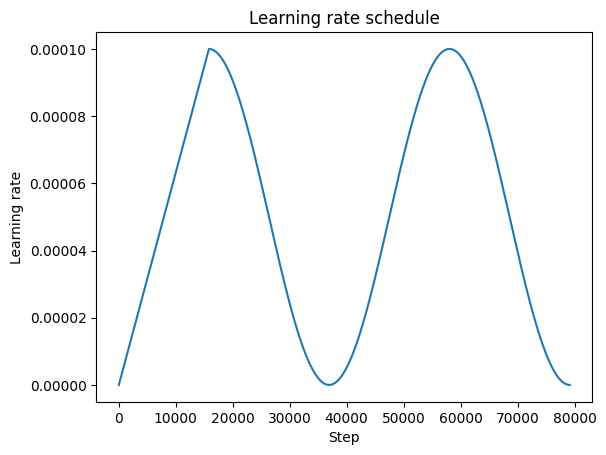

In [6]:
lr_values = []
for epoch in range(epochs):
    for step in range(n_steps_per_epoch):
        scheduler.step()
        lr_values.append(optimizer.param_groups[0]['lr'])

plt.plot(lr_values)
plt.ylabel('Learning rate')
plt.xlabel('Step')
plt.title('Learning rate schedule')
plt.show()

scheduler = get_cosine_schedule_with_warmup(optimizer, num_warmup_steps=n_warmup_steps, num_training_steps=n_steps, num_cycles=1.5)

In [7]:
def plot_original(pixel_values, mask):
    pixel_values = pixel_values.squeeze().cpu()
    pixel_values = (1 + pixel_values)/2
    mask = np.repeat(np.repeat(mask.cpu().numpy().reshape((patch_width, patch_width)), model.config.patch_size, axis=1), model.config.patch_size, axis=0)
    mask = 1 - mask
    pixel_values = (pixel_values * mask).clip(0, 1).squeeze()
    return pixel_values

def plot_reconstruction(reconstruction, mask):
    reconstruction = reconstruction.detach().squeeze().cpu()
    reconstruction = (1 + reconstruction)/2
    mask = np.repeat(np.repeat(mask.cpu().numpy().reshape((patch_width, patch_width)), model.config.patch_size, axis=1), model.config.patch_size, axis=0)
    reconstruction = (reconstruction * mask).clip(0, 1).squeeze()
    return reconstruction

def plot_images_from_batch(image, mask, reconstruction, rows, display_test=False):
    fig, axs = plt.subplots(rows, 3, figsize=(10, 5*rows))
    
    # If only one row, axs will be 1-D array, not 2-D. Adjust accordingly.
    axs = axs.reshape(rows, -1) if rows == 1 else axs
    
    for i in range(rows):
        origin = plot_original(image[i], mask[i] if not display_test else torch.zeros_like(mask[i]))
        axs[i, 0].imshow(origin, cmap='hot', vmin=0, vmax=1)
        axs[i, 0].set_title(f"Original {i+1}")
        
        # Plot the reconstructed image
        recons = plot_reconstruction(reconstruction[i], mask[i])
        axs[i, 1].imshow(recons, cmap='hot', vmin=0, vmax=1)
        axs[i, 1].set_title(f"Reconstructed {i+1}")
        
        if display_test:
            origin = plot_original(image[i], mask[i])
        total = recons + origin
        axs[i, 2].imshow(total, cmap='hot', vmin=0, vmax=1)
        axs[i, 2].set_title(f"Total {i+1}")
        
    plt.tight_layout()
    plt.show()
    
def plot_global_comparison(input_image, reconstructed_image):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    input_image, reconstructed_image = input_image.detach().cpu().squeeze(), reconstructed_image.detach().cpu().squeeze()

    axs[0].imshow(input_image, cmap='hot', vmin=0, vmax=1)
    axs[1].imshow(reconstructed_image, cmap='hot', vmin=0, vmax=1)
    axs[0].axis('off')
    axs[1].axis('off')

    plt.show()

- Ajouter du weight decay
- Mettre l'interpolation to 50% au lieu de 100%

  0%|          | 0/501 [00:00<?, ?it/s]

Epoch 1:
train: last batch loss 0.44 = 0.44 patch + 0.48 global
mu 0% lr ratio 0%


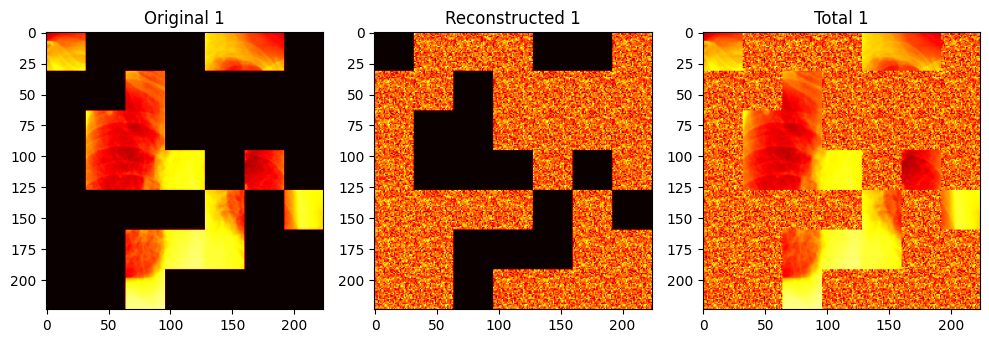

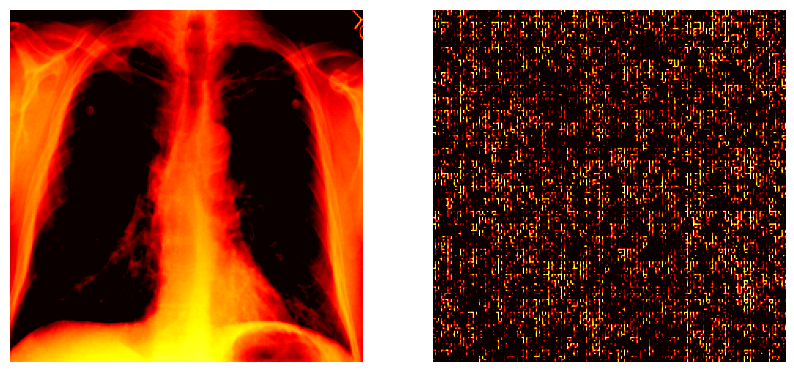

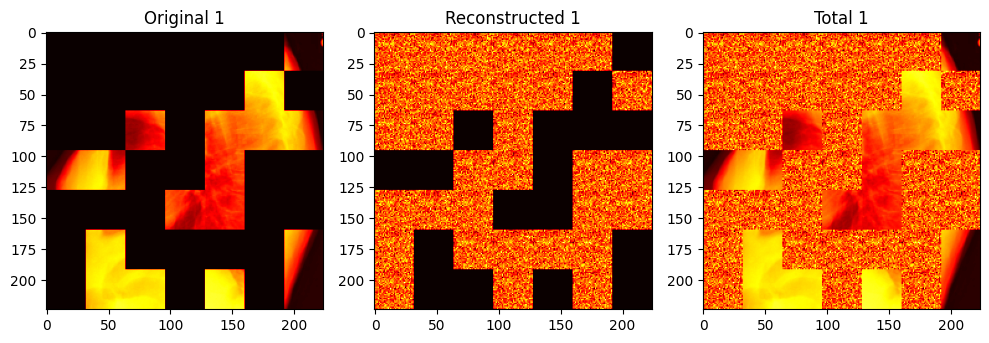

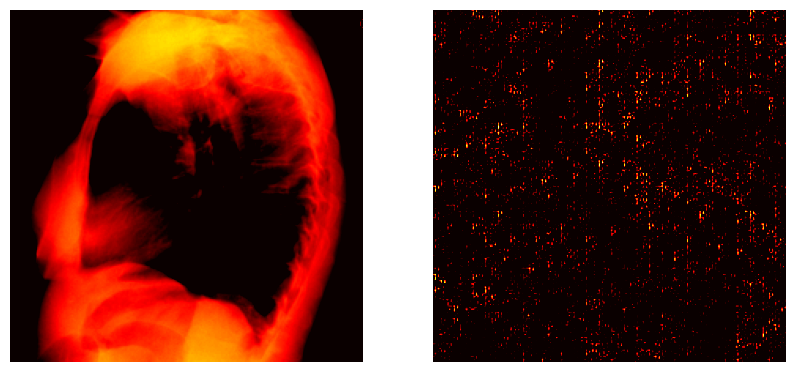

Epoch 11:
train: last batch loss 0.21 = 0.21 patch + 0.48 global
mu 0% lr ratio 0%


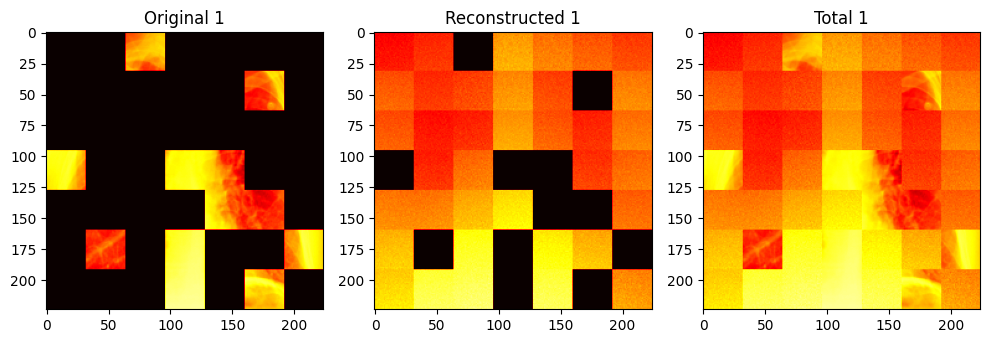

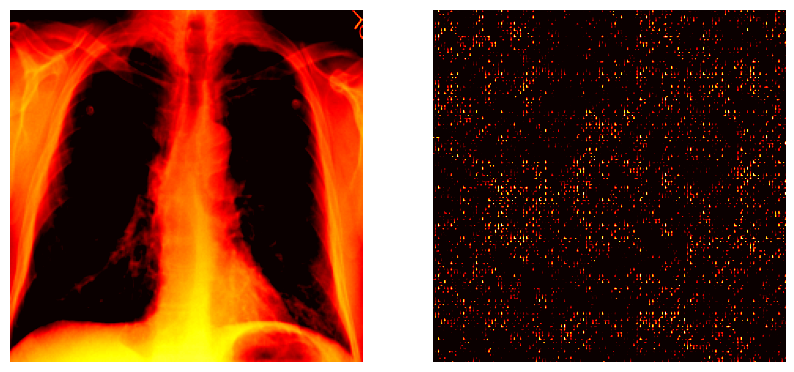

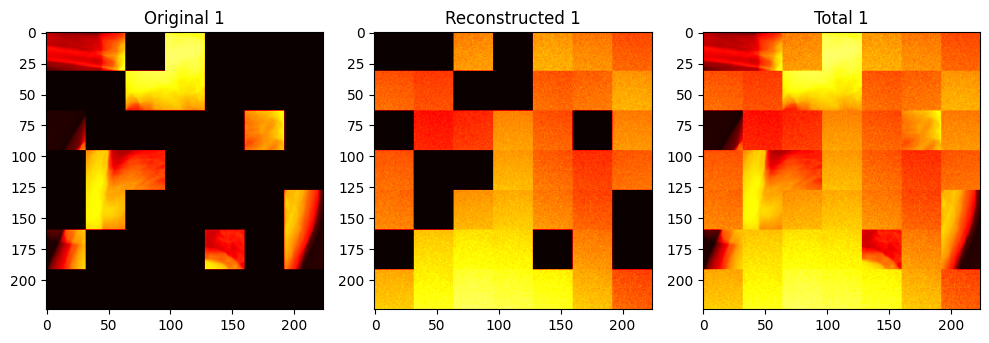

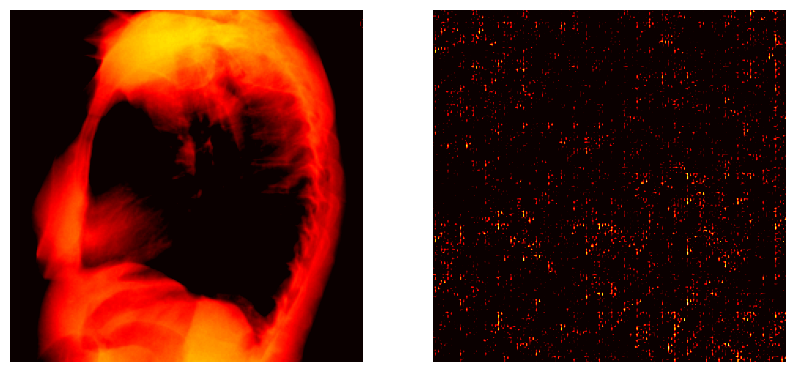

Epoch 21:
train: last batch loss 0.19 = 0.19 patch + 0.48 global
mu 0% lr ratio 0%


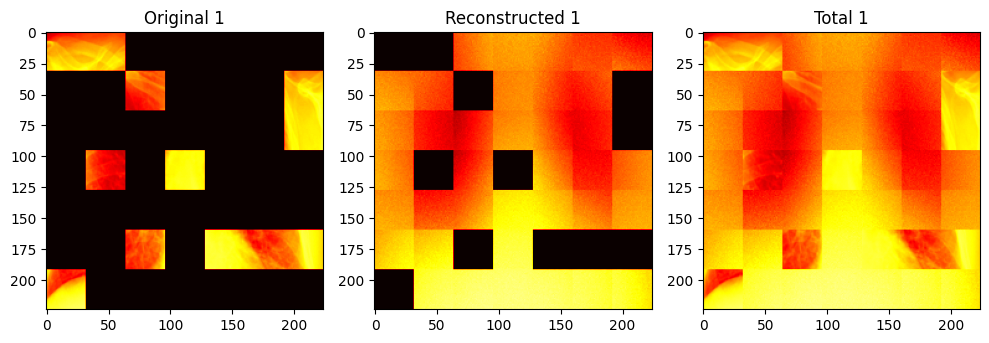

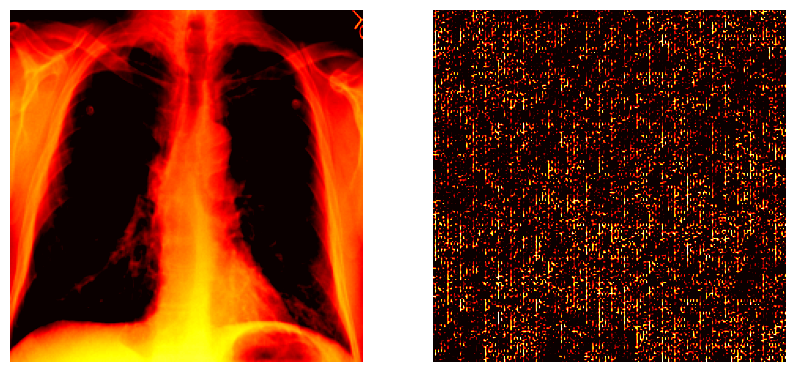

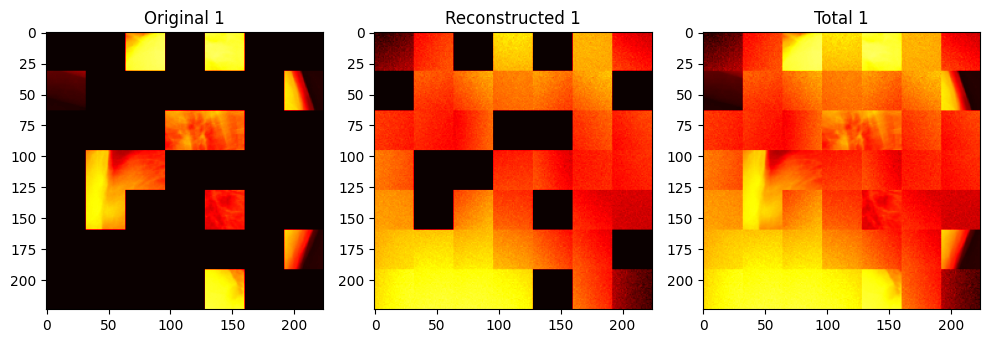

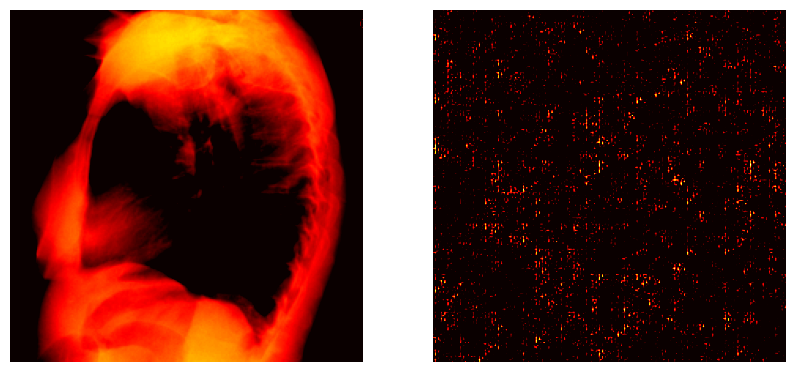

Epoch 31:
train: last batch loss 0.16 = 0.16 patch + 0.48 global
mu 0% lr ratio 0%


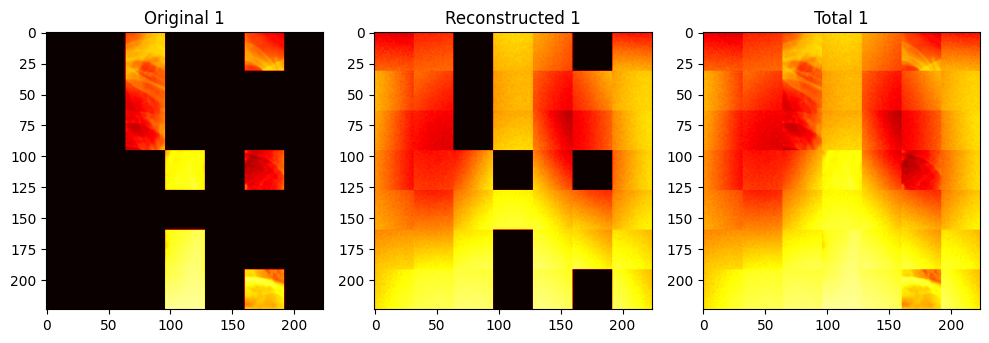

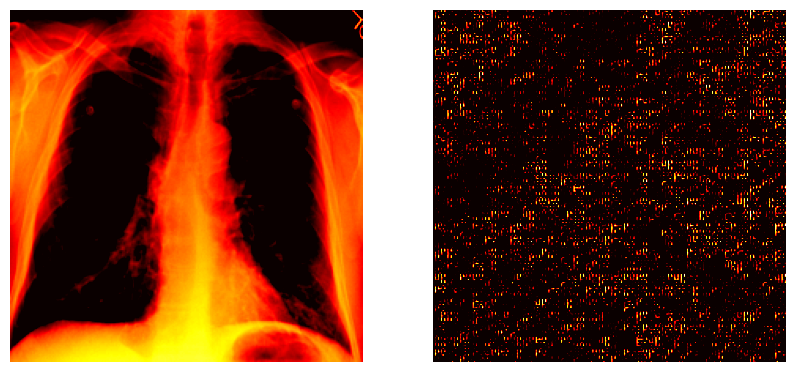

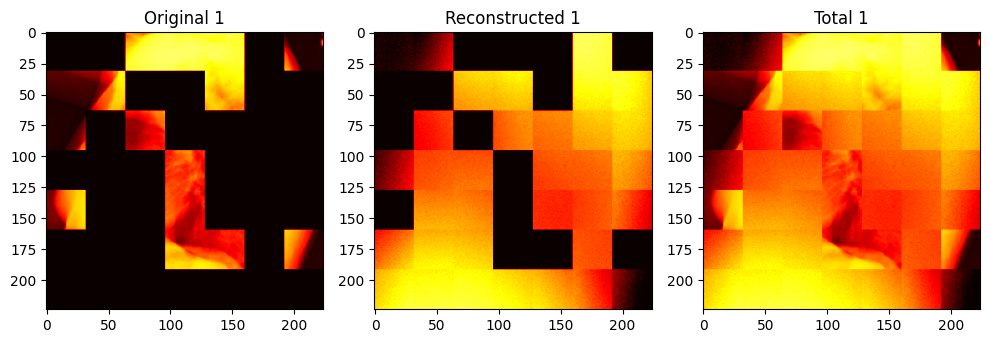

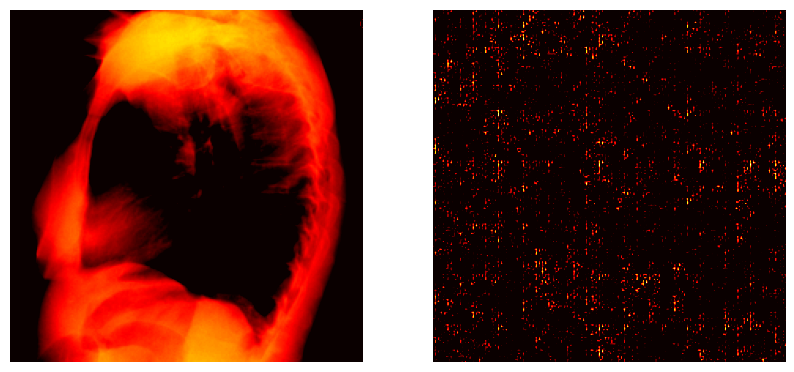

Epoch 41:
train: last batch loss 0.14 = 0.14 patch + 0.48 global
mu 0% lr ratio 0%


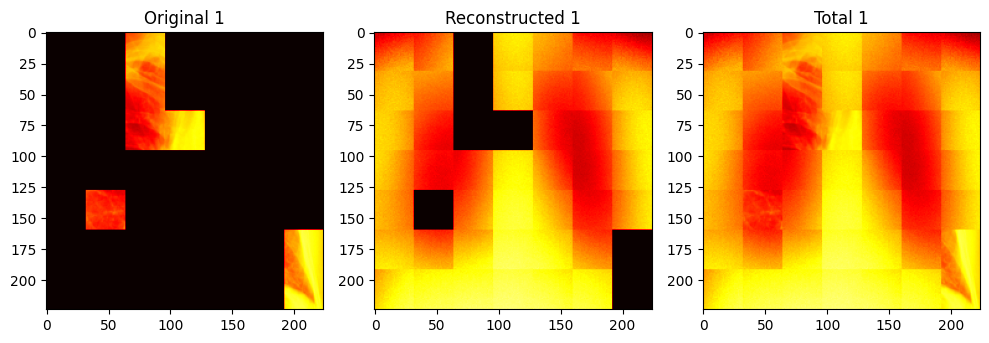

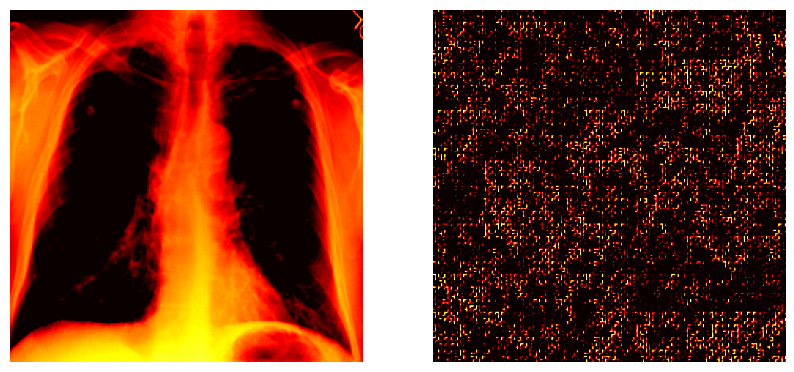

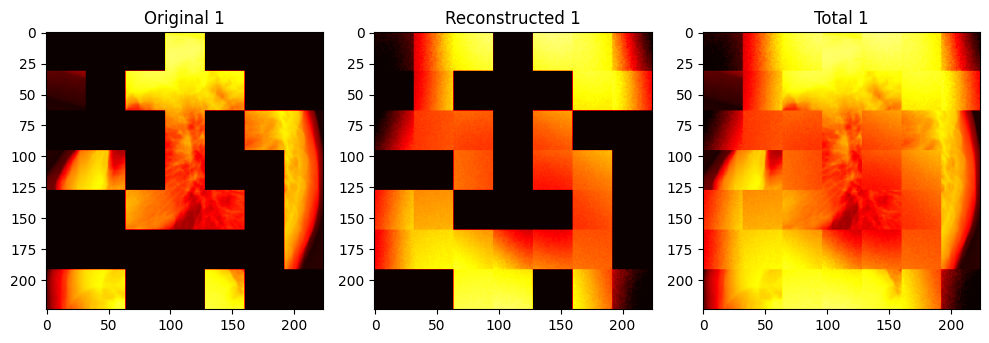

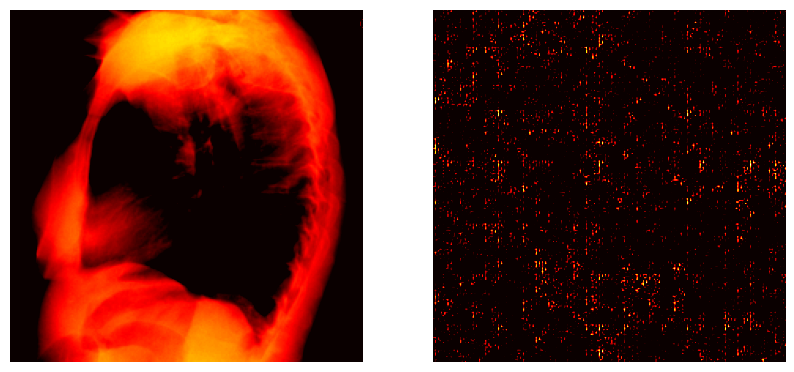

Epoch 51:
train: last batch loss 0.13 = 0.13 patch + 0.48 global
mu 0% lr ratio 1%


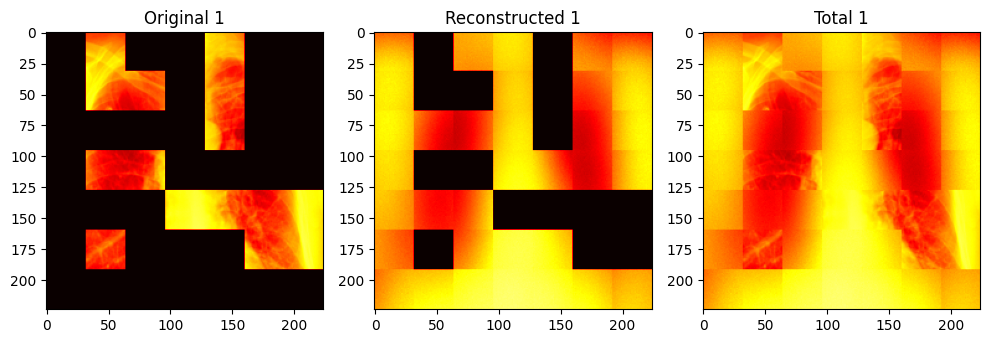

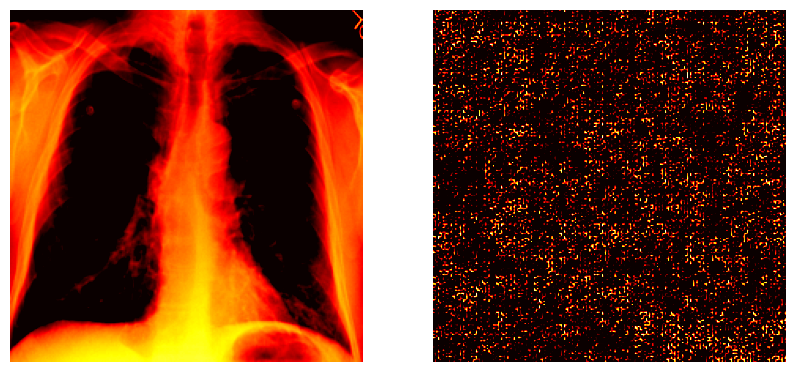

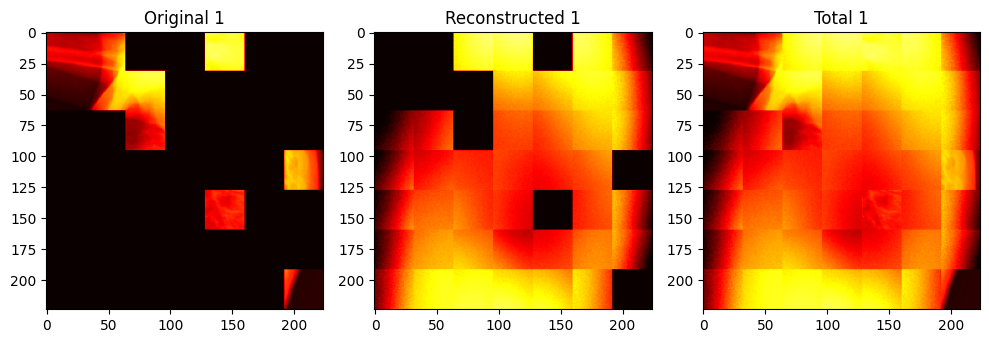

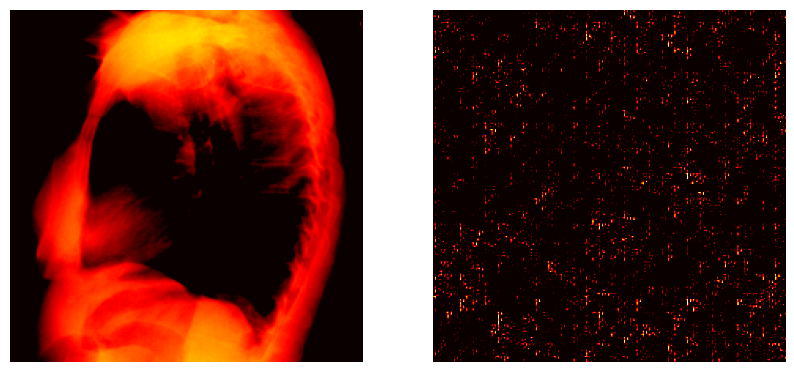

Epoch 61:
train: last batch loss 0.11 = 0.11 patch + 0.48 global
mu 0% lr ratio 1%


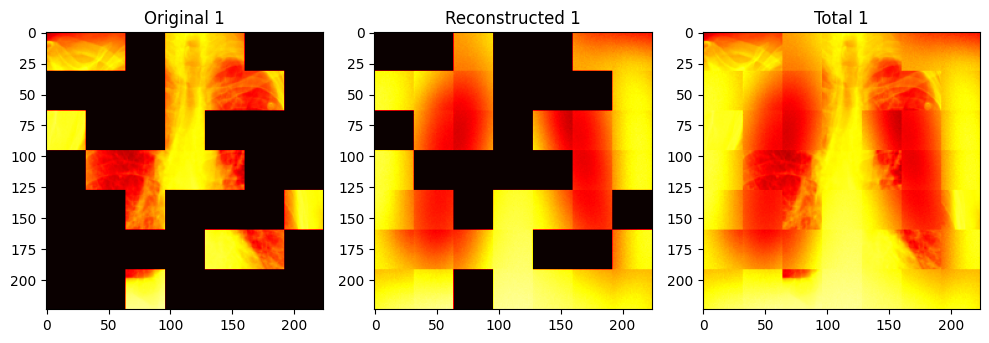

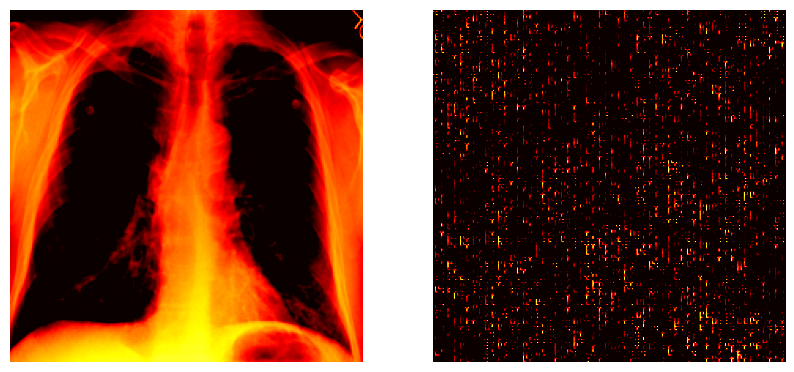

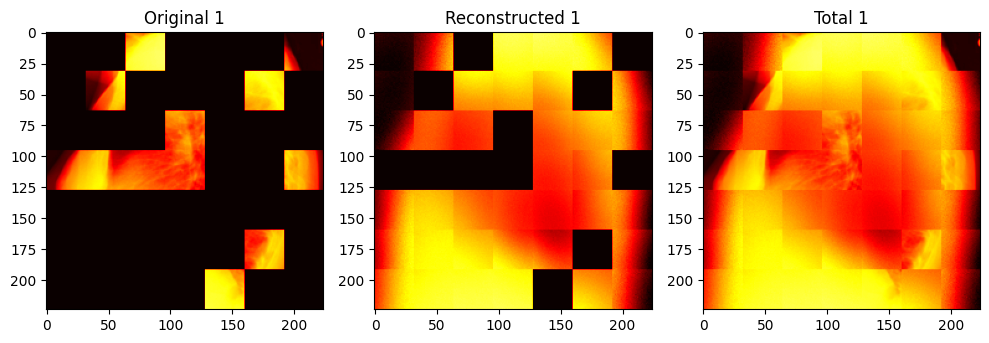

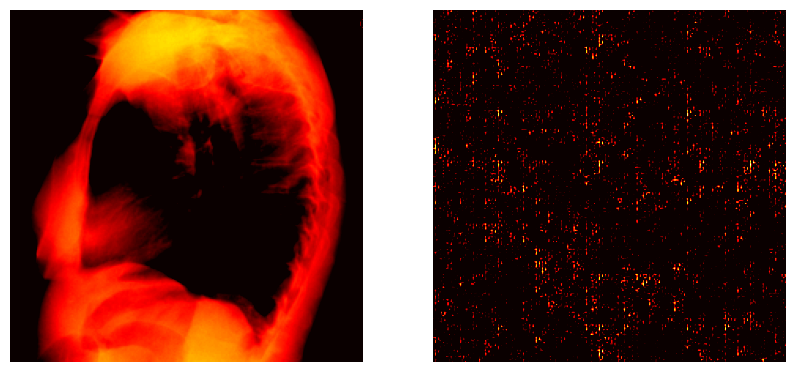

Epoch 71:
train: last batch loss 0.11 = 0.11 patch + 0.48 global
mu 0% lr ratio 1%


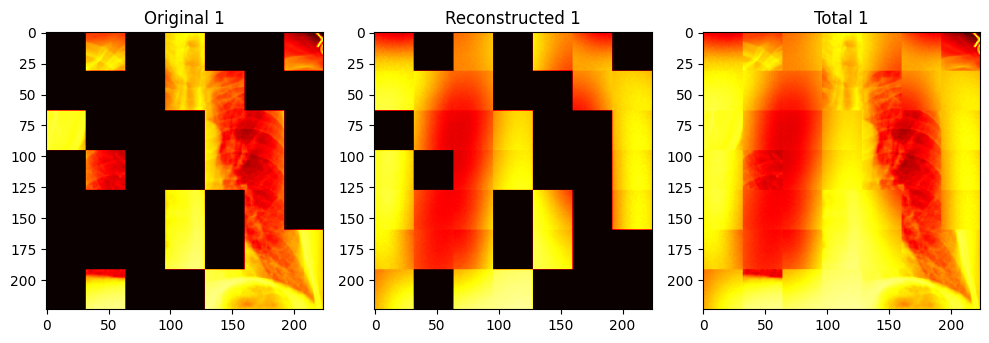

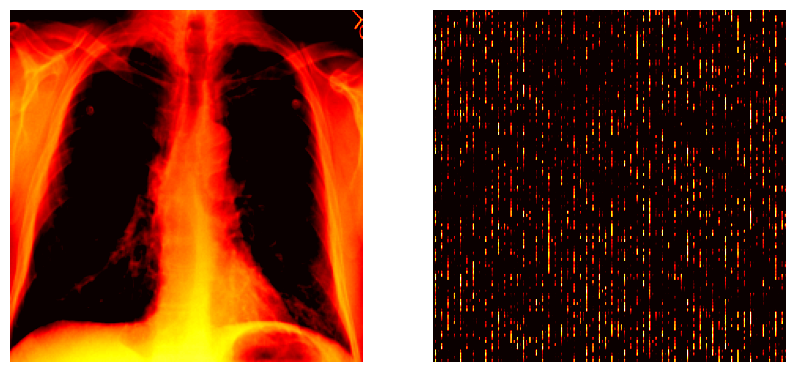

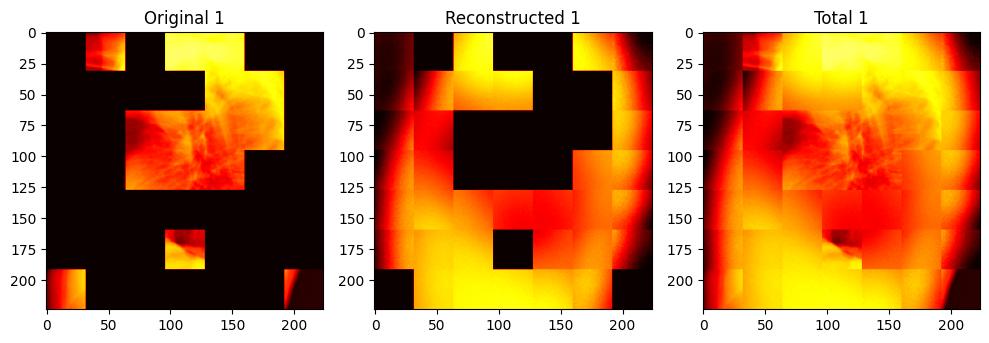

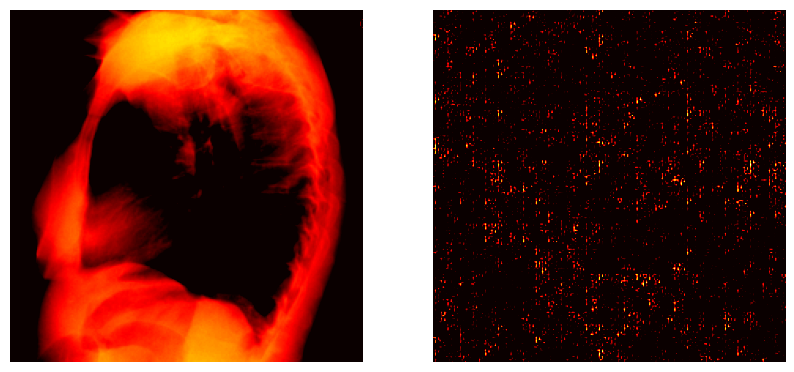

Epoch 81:
train: last batch loss 0.11 = 0.11 patch + 0.48 global
mu 0% lr ratio 1%


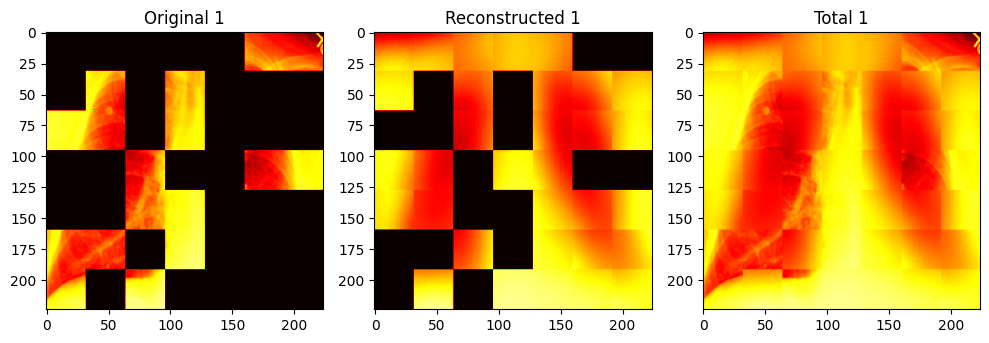

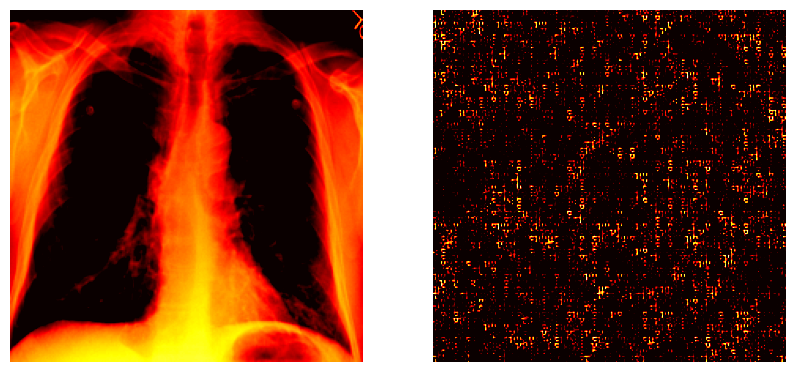

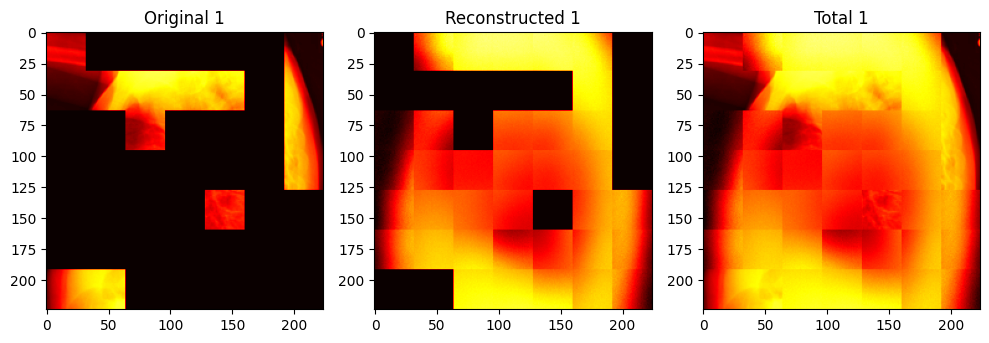

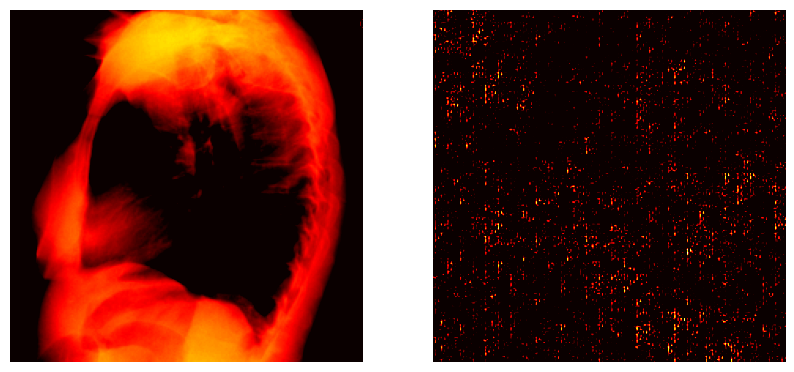

Epoch 91:
train: last batch loss 0.10 = 0.10 patch + 0.48 global
mu 0% lr ratio 1%


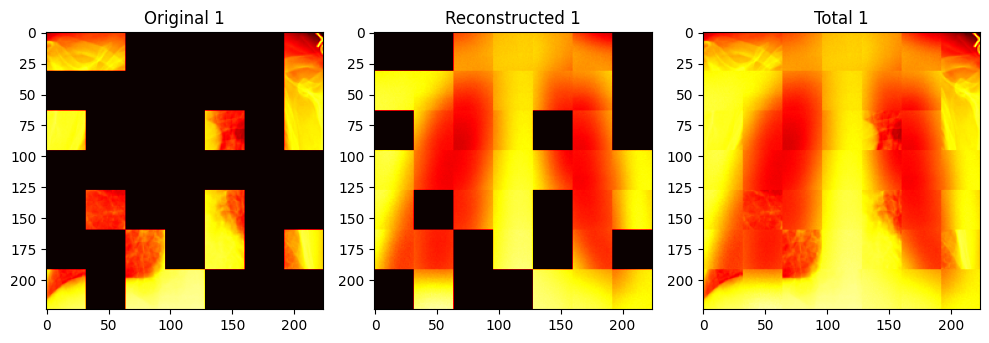

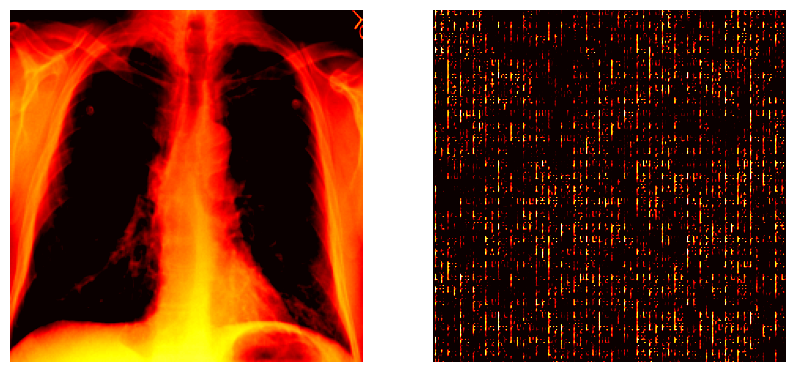

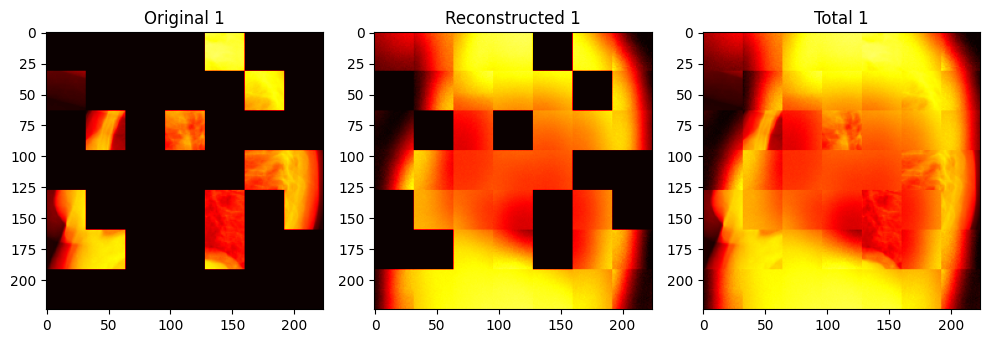

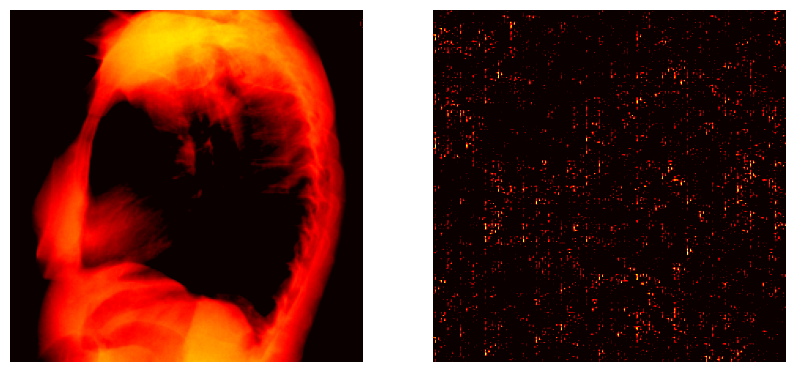

Epoch 101:
train: last batch loss 0.10 = 0.10 patch + 0.37 global
mu 0% lr ratio 1%


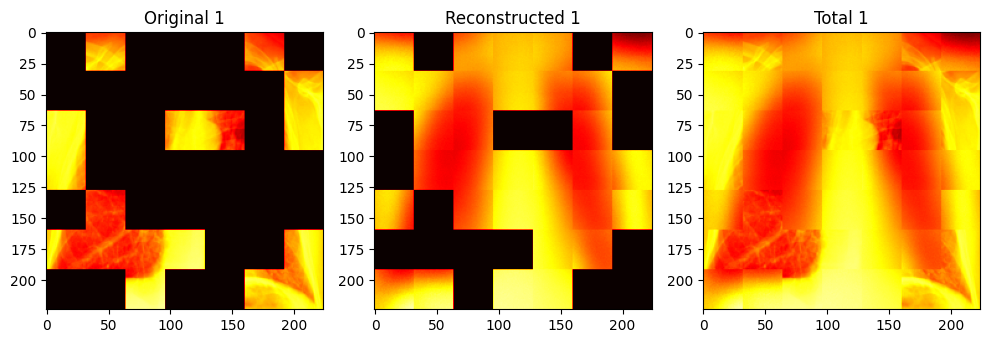

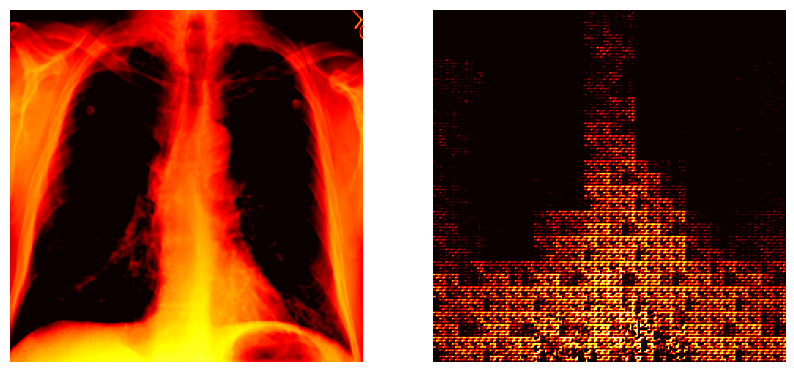

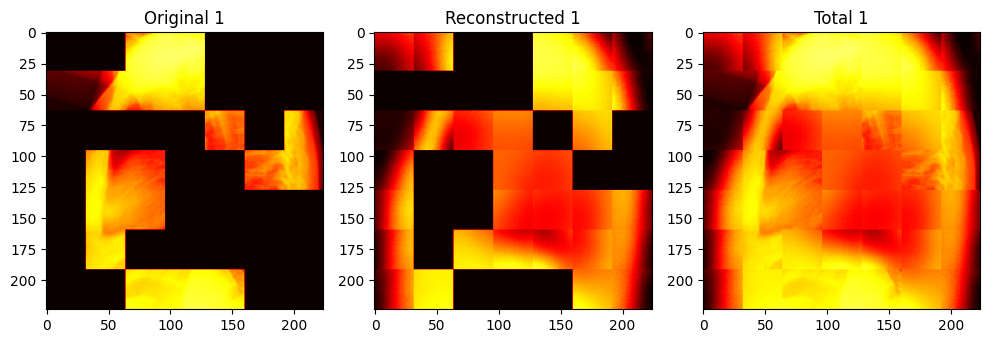

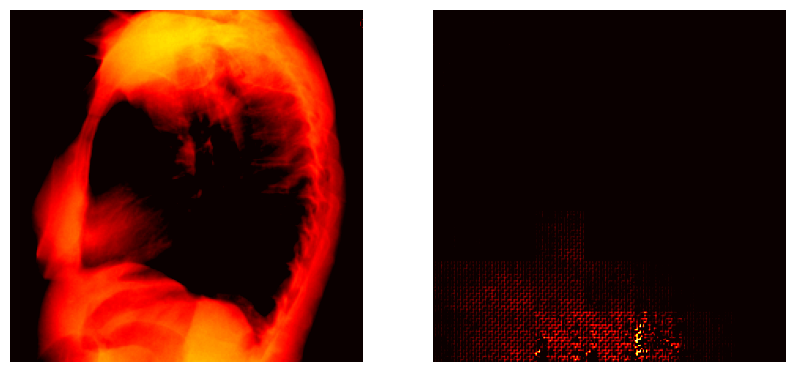

Epoch 111:
train: last batch loss 0.10 = 0.09 patch + 0.25 global
mu 2% lr ratio 1%


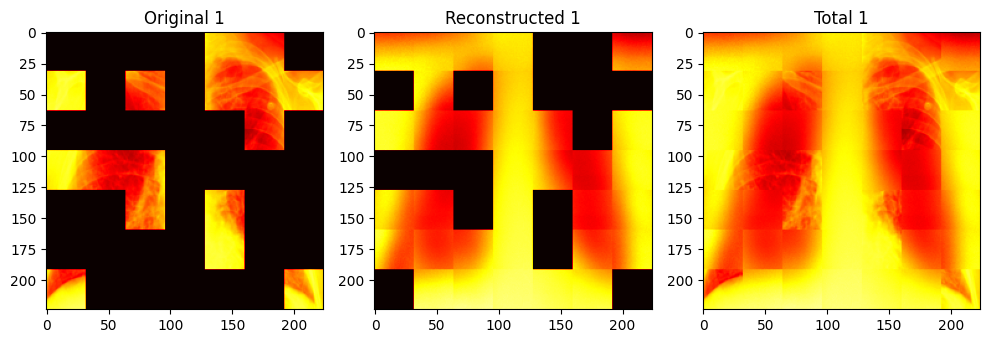

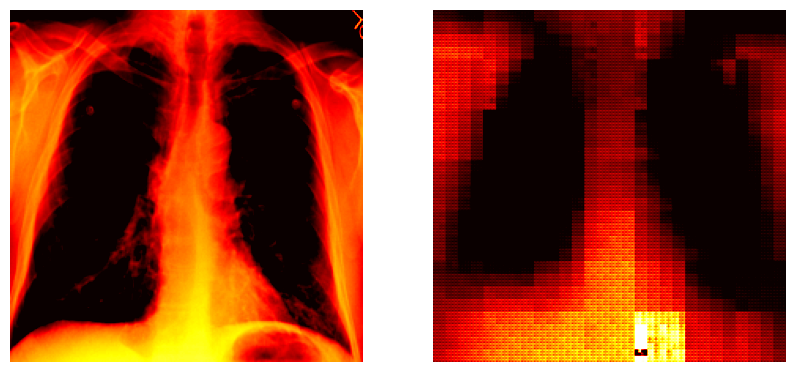

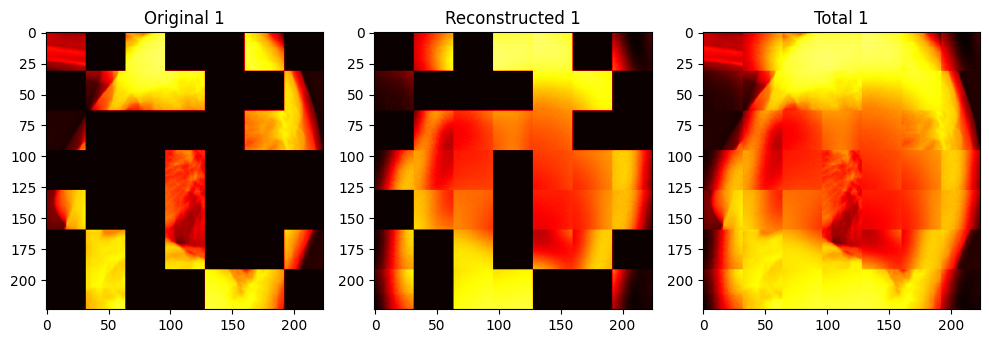

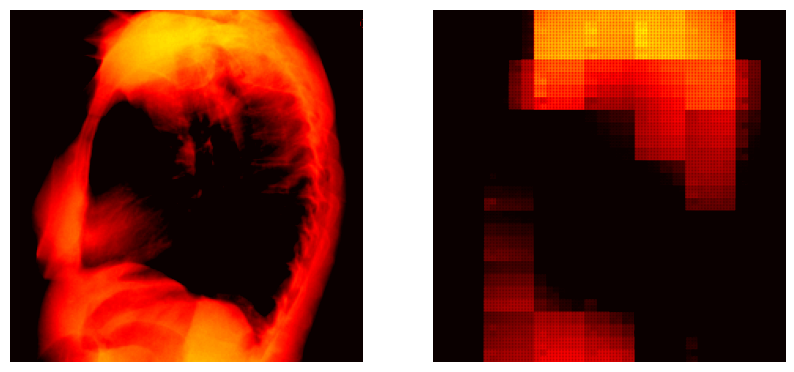

Epoch 121:
train: last batch loss 0.10 = 0.09 patch + 0.22 global
mu 4% lr ratio 1%


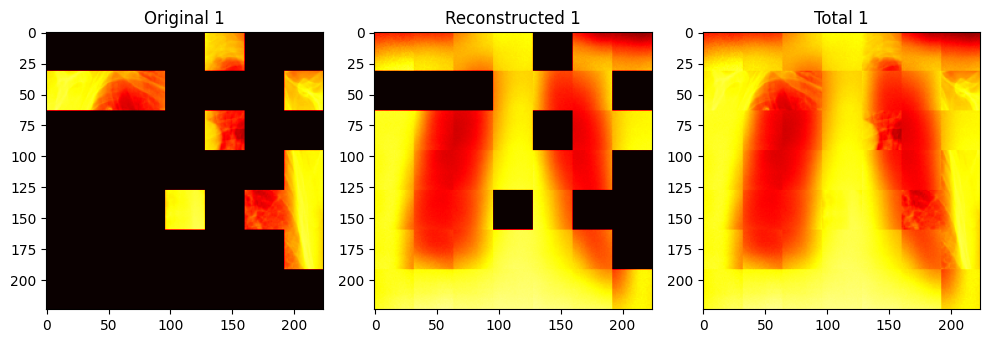

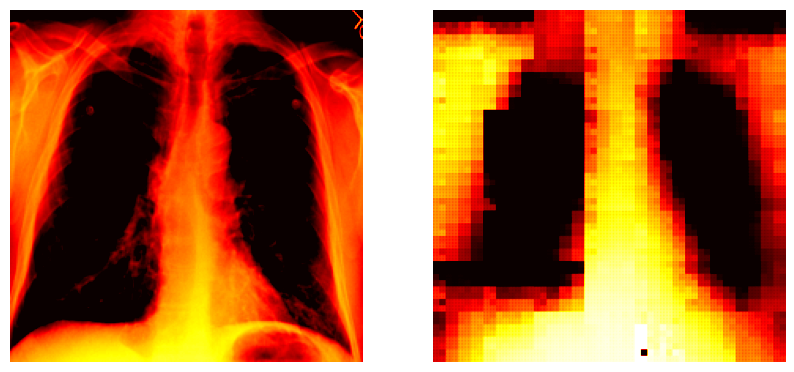

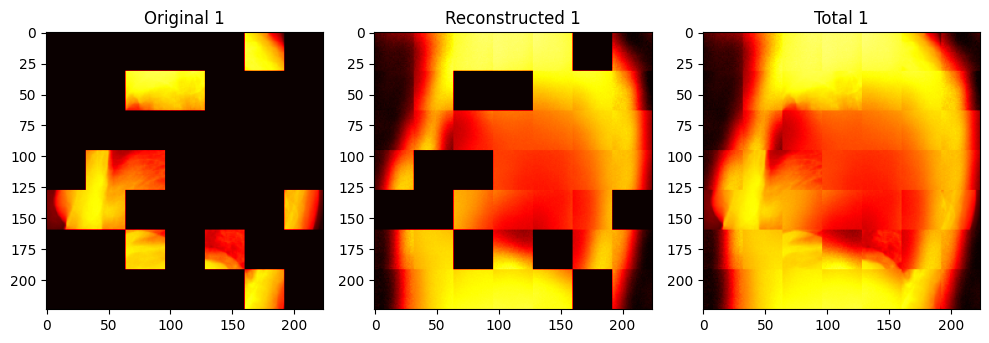

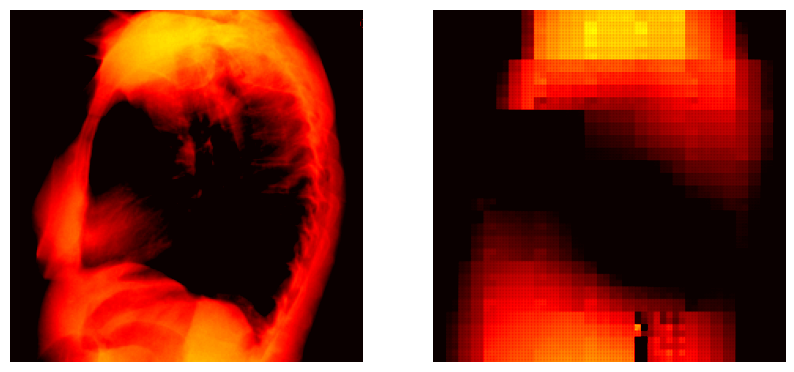

Epoch 131:
train: last batch loss 0.10 = 0.09 patch + 0.21 global
mu 6% lr ratio 1%


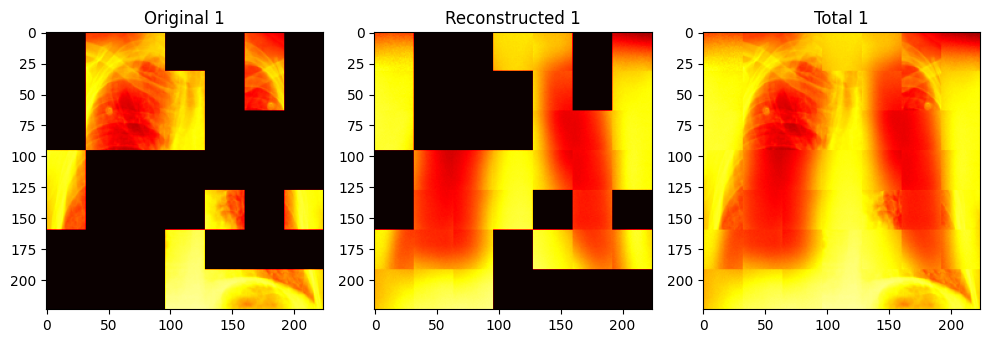

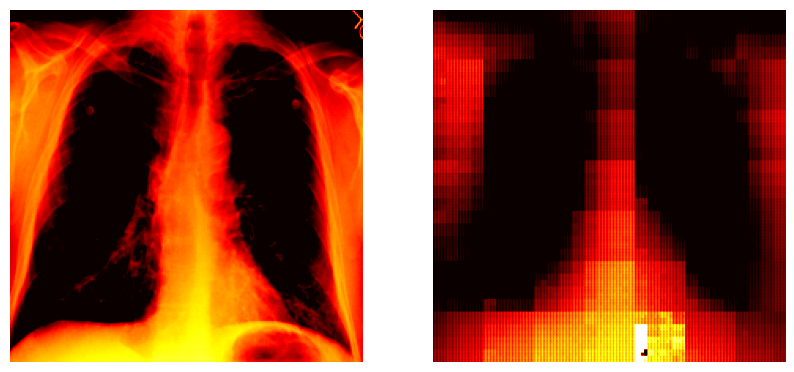

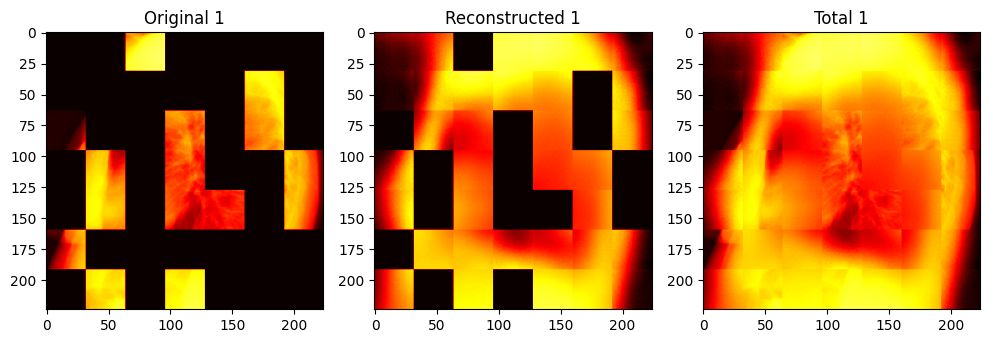

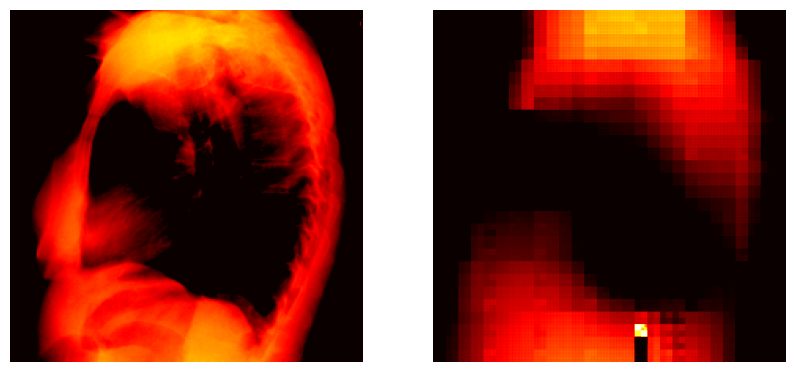

Epoch 141:
train: last batch loss 0.10 = 0.09 patch + 0.19 global
mu 8% lr ratio 1%


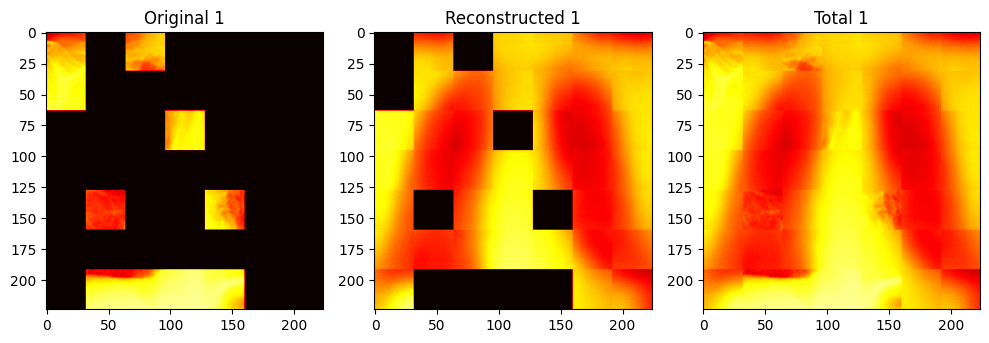

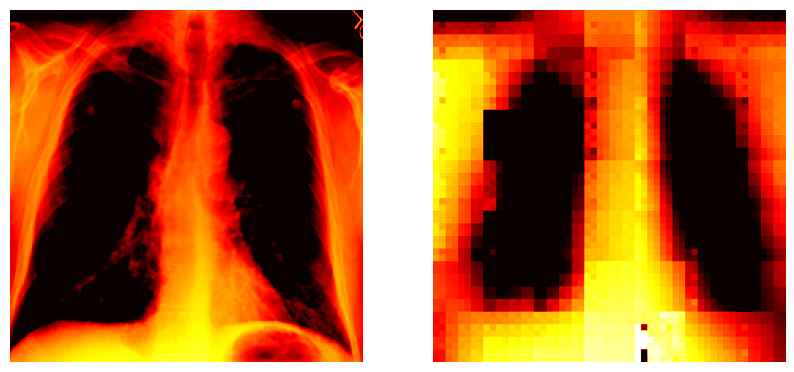

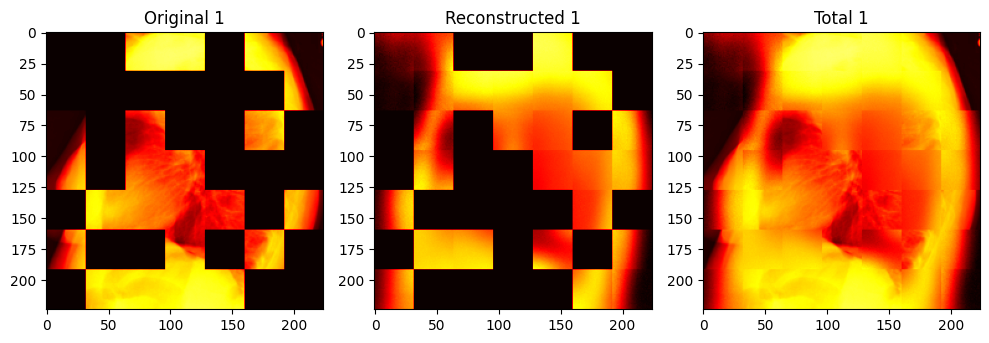

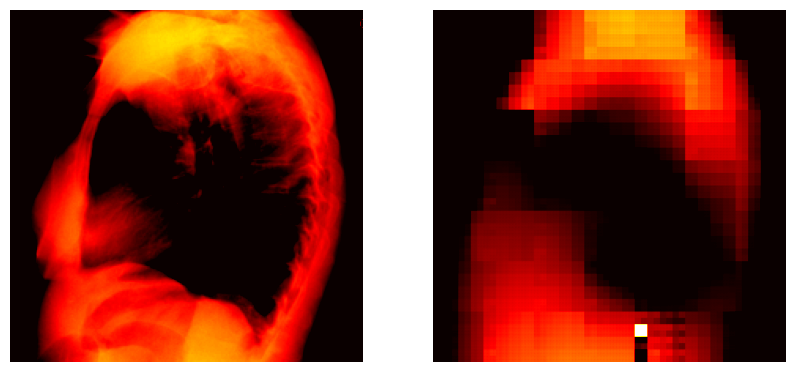

Epoch 151:
train: last batch loss 0.10 = 0.09 patch + 0.18 global
mu 10% lr ratio 1%


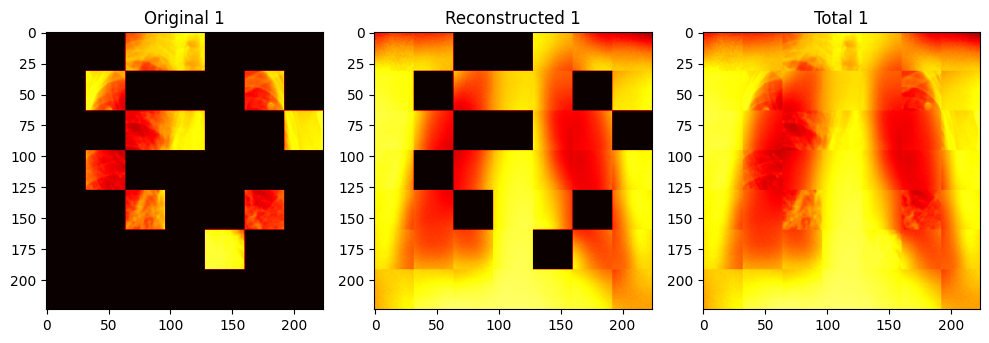

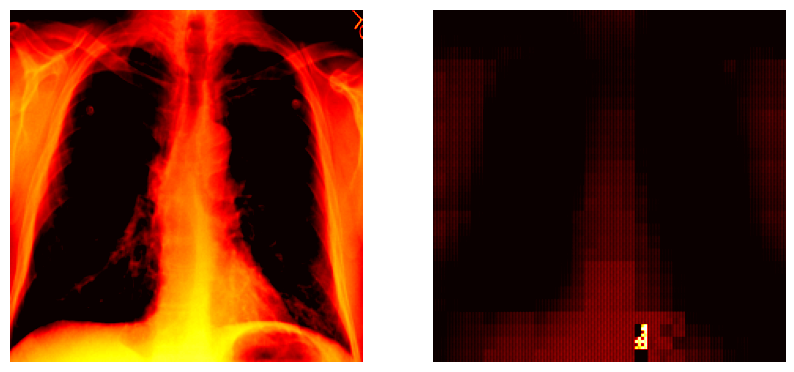

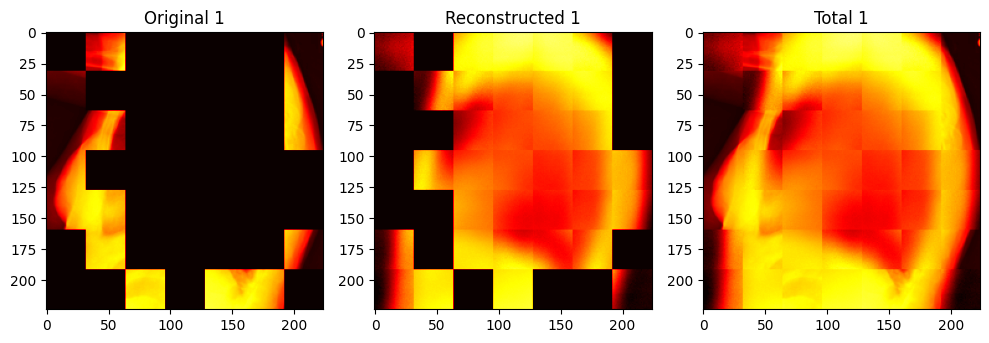

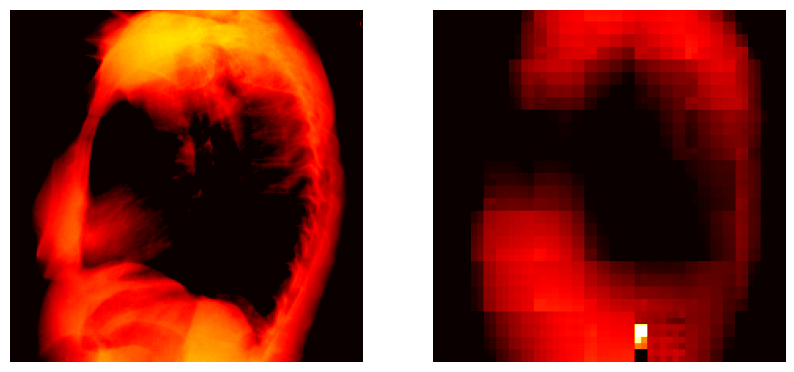

Epoch 161:
train: last batch loss 0.10 = 0.09 patch + 0.21 global
mu 12% lr ratio 1%


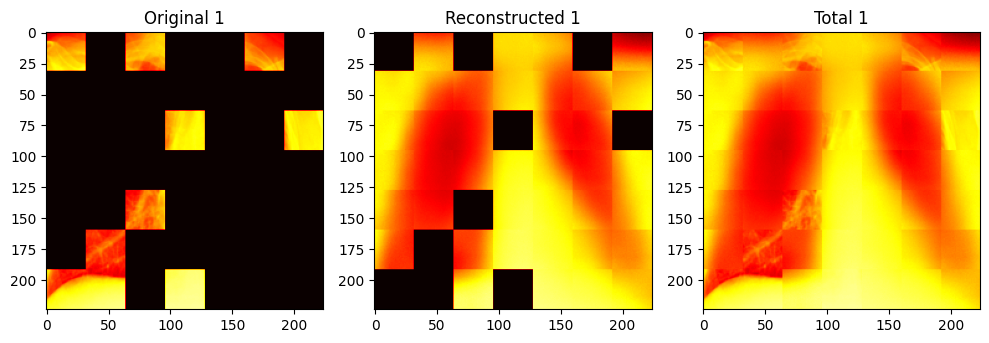

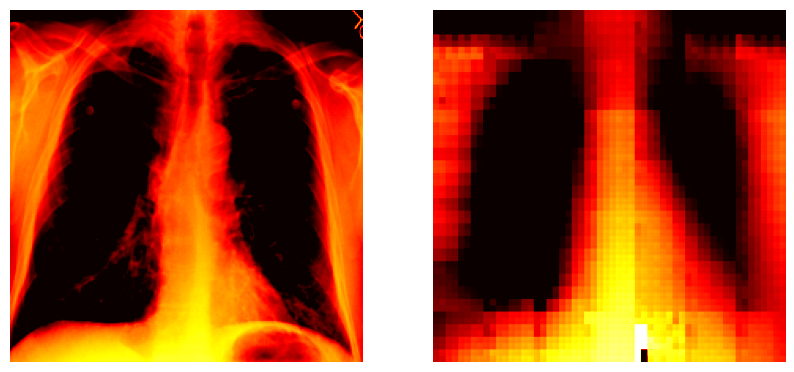

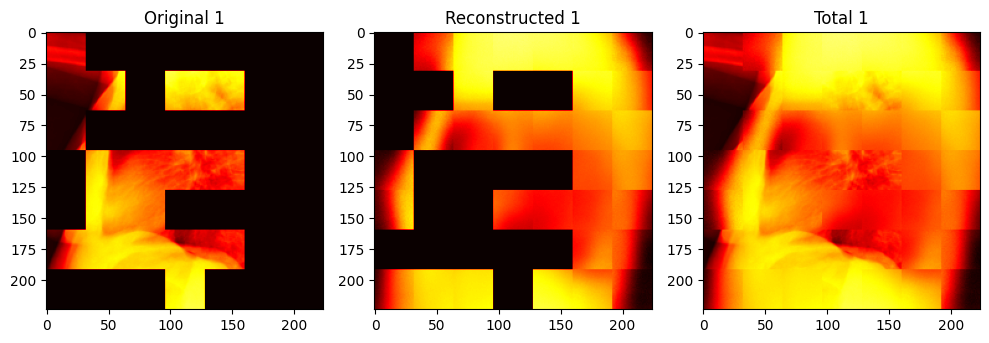

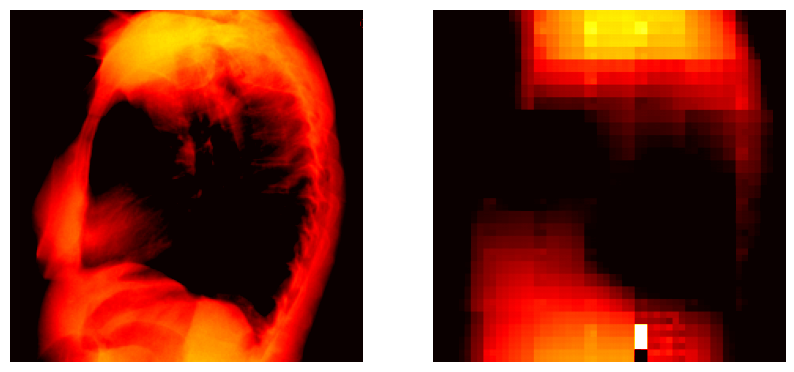

Epoch 171:
train: last batch loss 0.10 = 0.08 patch + 0.19 global
mu 14% lr ratio 0%


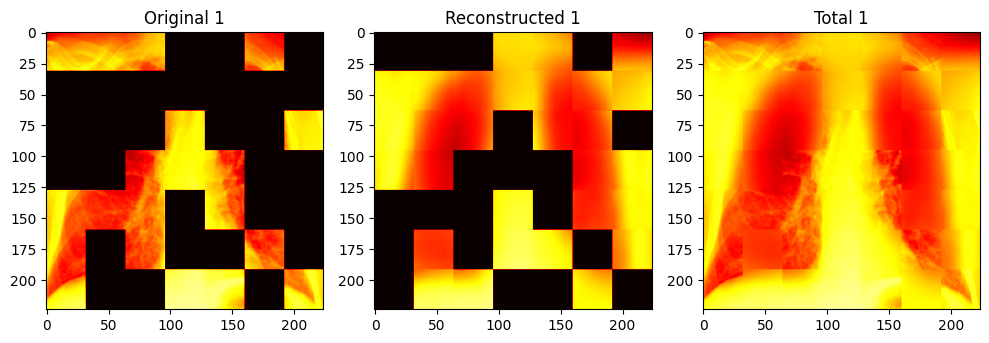

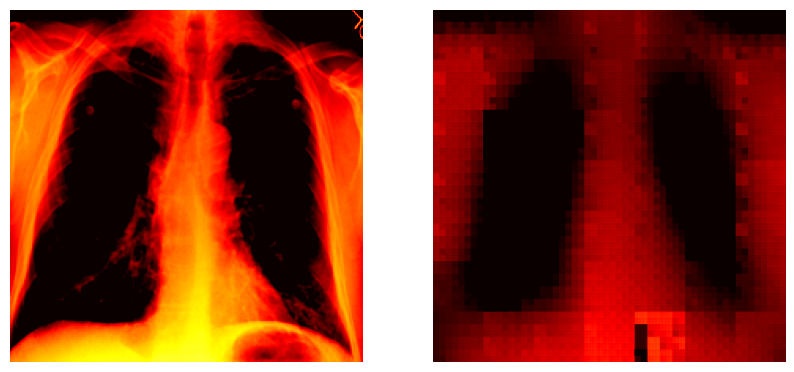

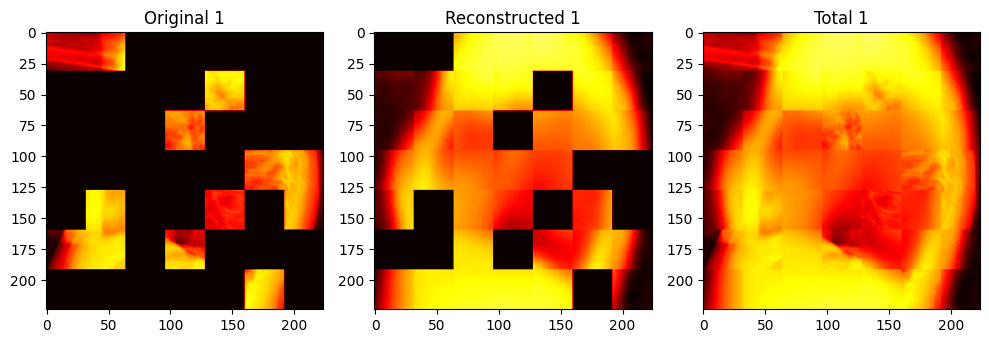

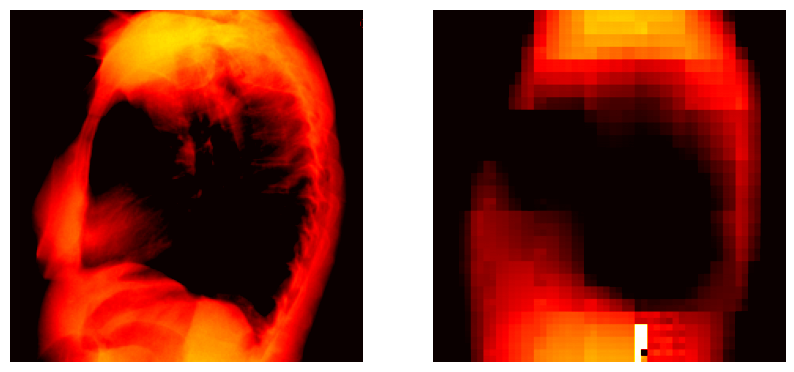

Epoch 181:
train: last batch loss 0.10 = 0.09 patch + 0.18 global
mu 16% lr ratio 0%


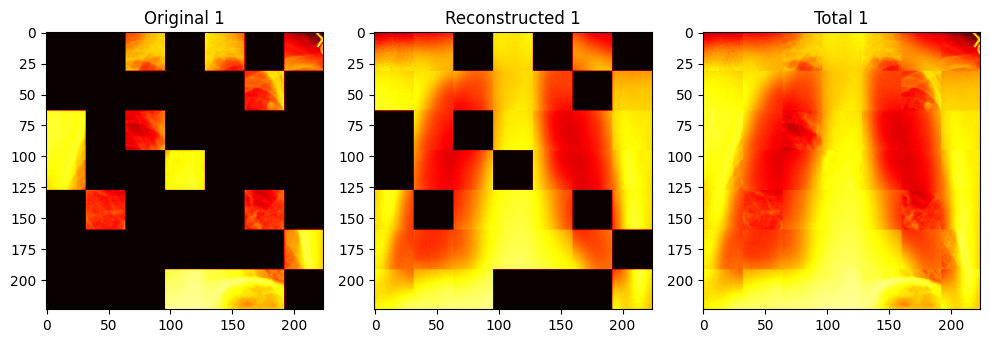

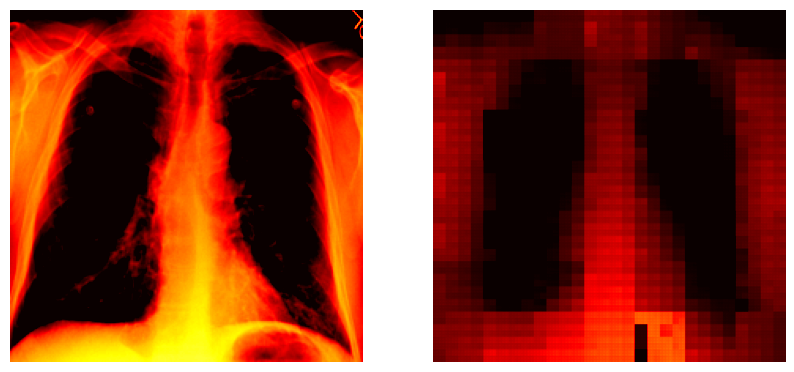

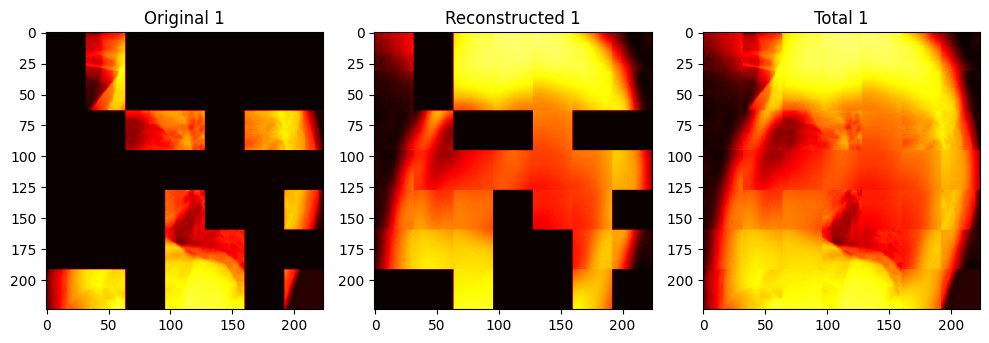

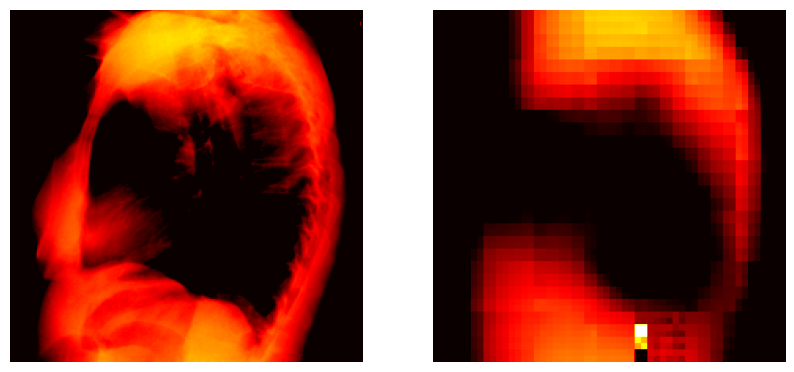

Epoch 191:
train: last batch loss 0.10 = 0.08 patch + 0.18 global
mu 18% lr ratio 0%


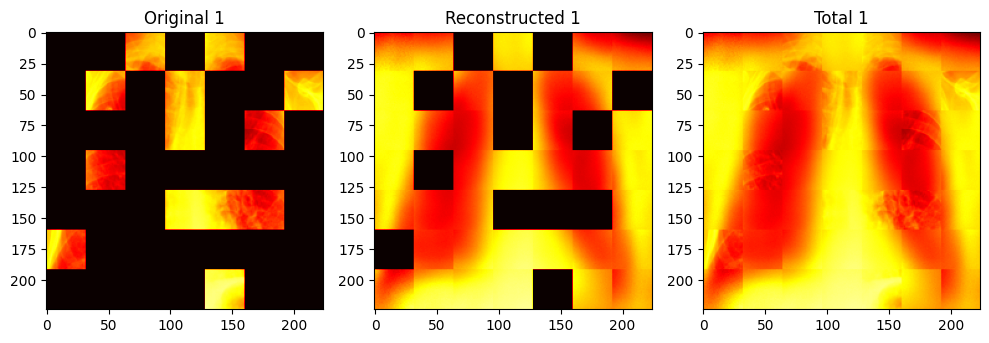

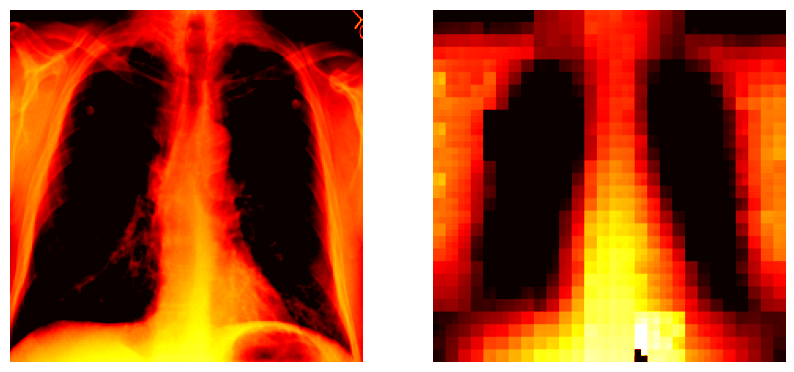

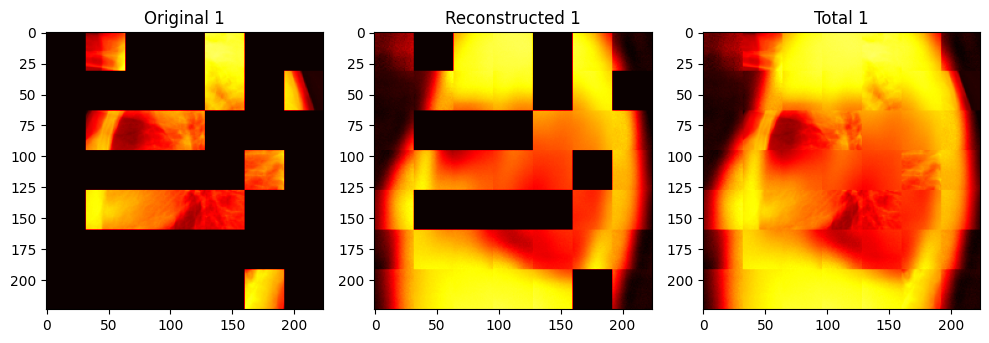

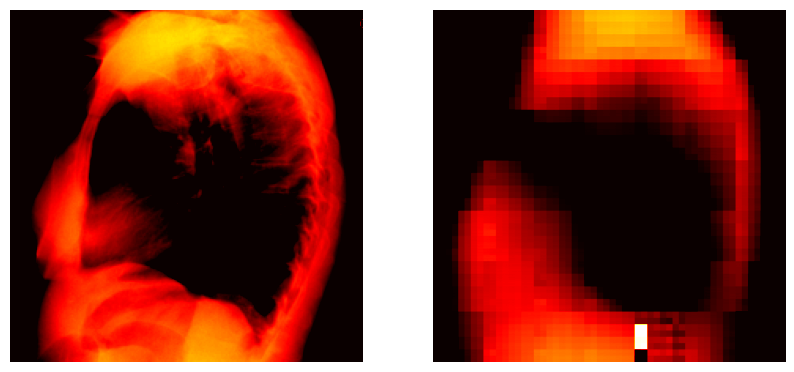

Epoch 201:
train: last batch loss 0.10 = 0.08 patch + 0.19 global
mu 20% lr ratio 0%


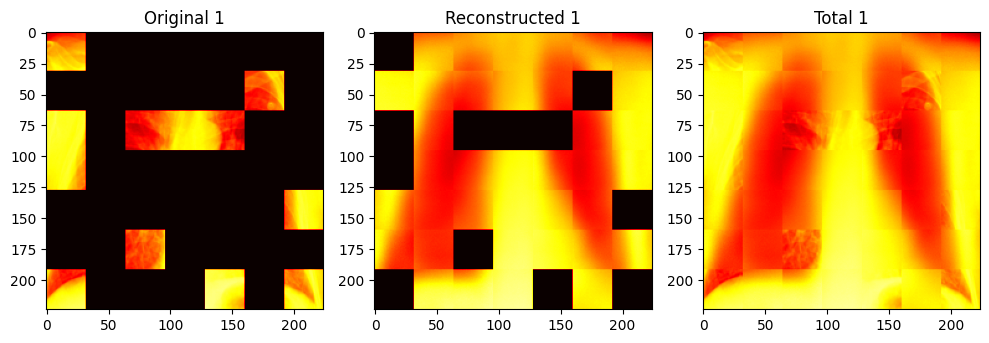

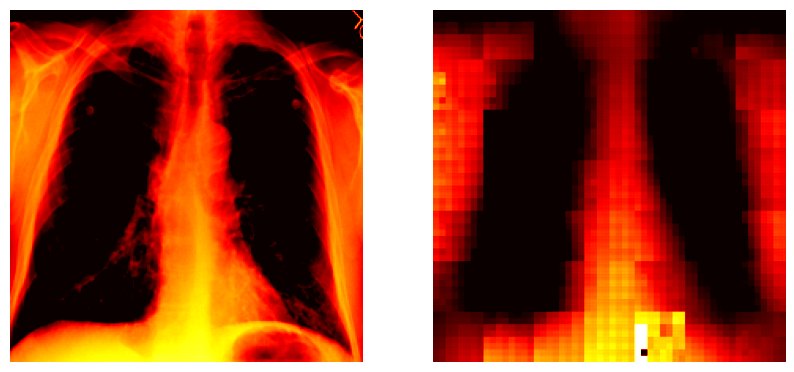

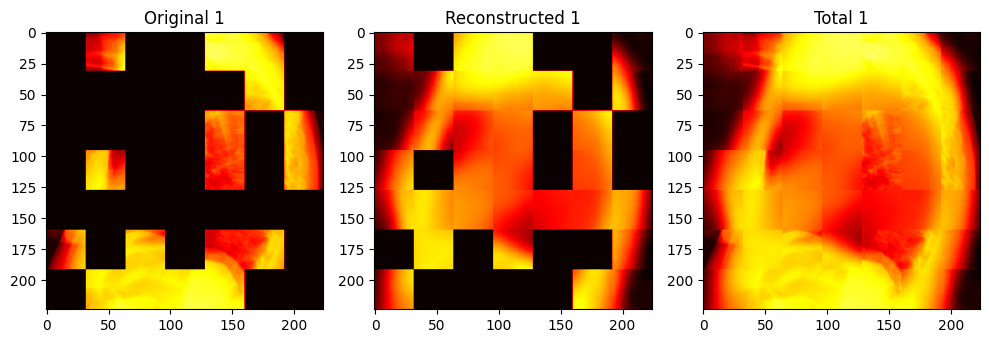

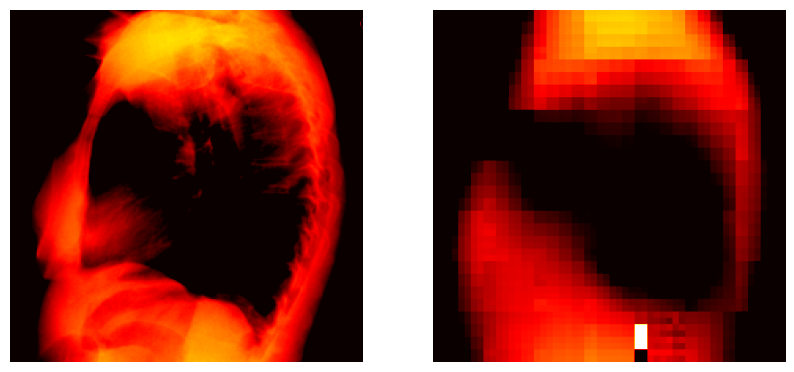

Epoch 211:
train: last batch loss 0.10 = 0.08 patch + 0.18 global
mu 22% lr ratio 0%


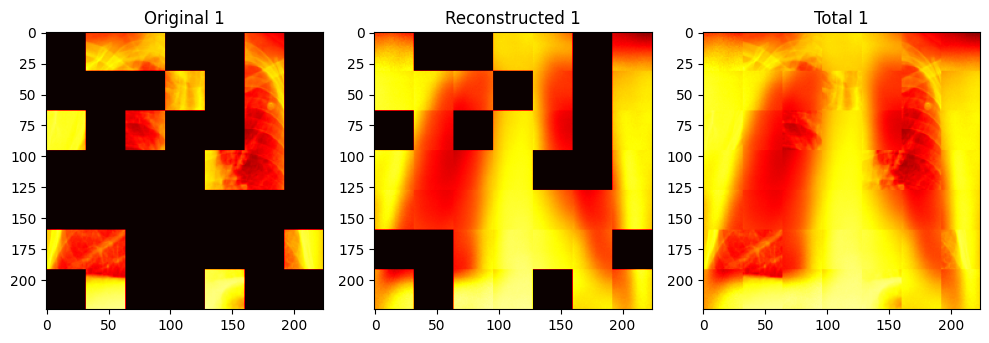

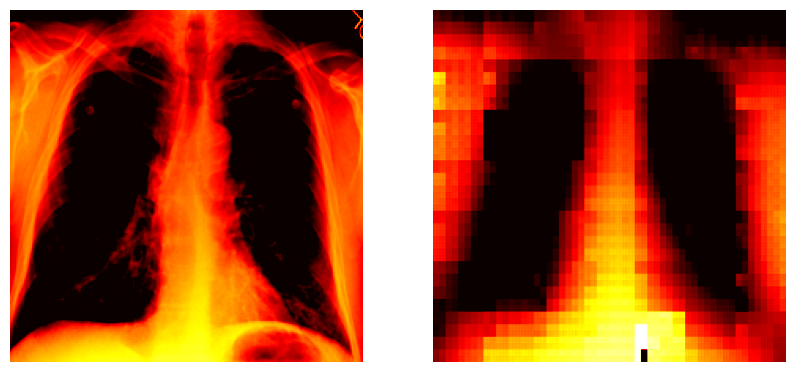

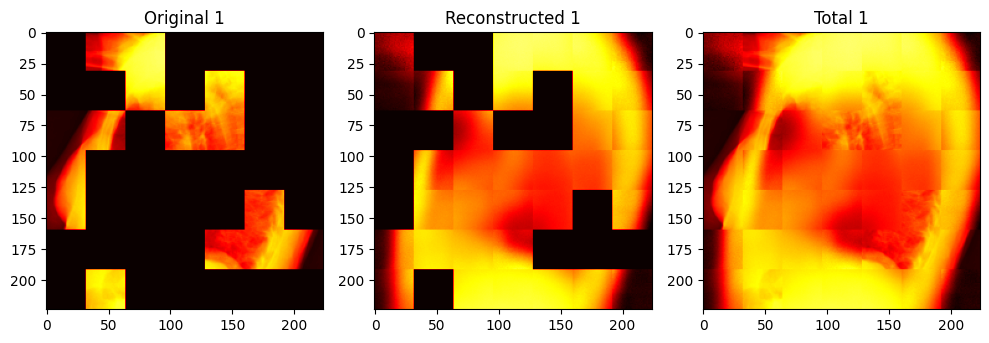

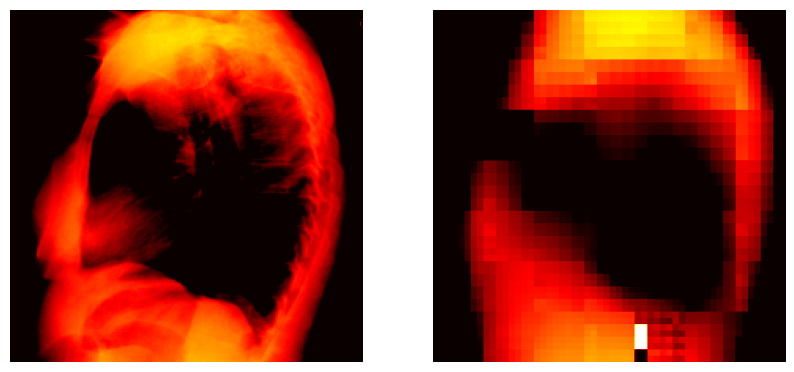

Epoch 221:
train: last batch loss 0.11 = 0.09 patch + 0.18 global
mu 24% lr ratio 0%


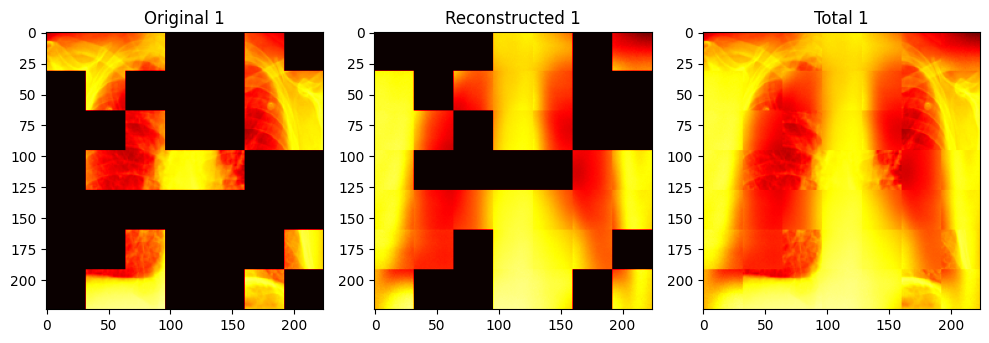

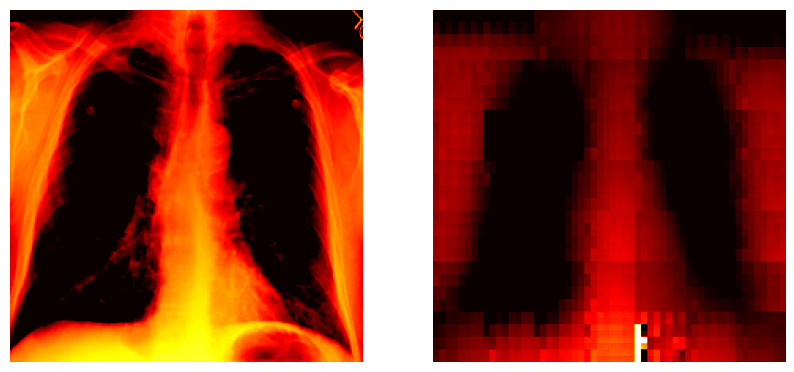

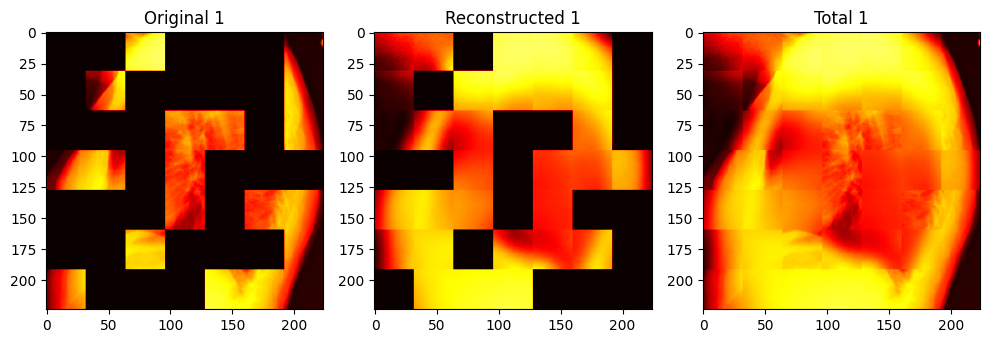

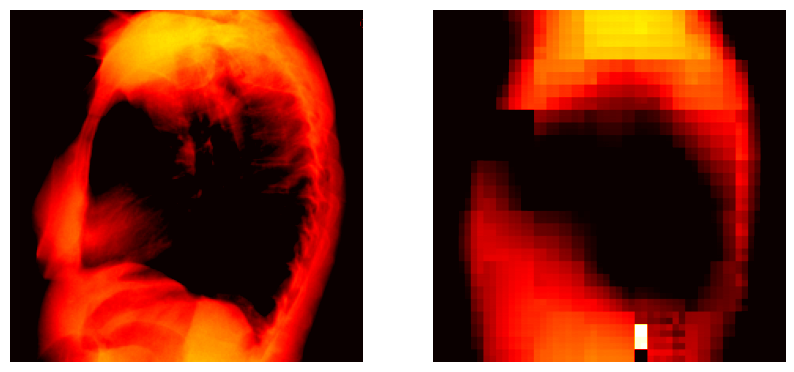

In [8]:
import numpy as np
from tqdm.notebook import tqdm

losses = list()
step = 0
for epoch in tqdm(range(epochs)):
    epoch_loss = []

    for idx, batch in enumerate(train_dl):
        step +=1
        optimizer.zero_grad()

        #generate mask
        image = batch['image'][:, None, :, :]
        mask = (torch.zeros((image.shape[0], num_patches)).float().uniform_(0, 1) < mask_ratio).int()
        mask = mask.to(device)

        result = model(image, bool_masked_pos=mask)
        
        patch_loss = result["patchwise_loss"]
        global_loss = result["global_reconstruction_loss"]
        mu = 0 if step < n_warmup_steps else (step - n_warmup_steps)/n_steps
        weighted_loss = mu * global_loss + (1-mu) * patch_loss

        weighted_loss.backward()
        optimizer.step()
        scheduler.step()

        epoch_loss.append(weighted_loss.detach().item())
        losses.append(weighted_loss.detach().item())

    epoch_loss = np.array(epoch_loss).mean()

    if epoch%10 == 0:
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Epoch {1+epoch}:") 
        print("train: last batch loss {:.2f}".format(weighted_loss), "= {:.2f} patch + {:.2f} global".format(patch_loss, global_loss))
        print("mu {:.2f}%".format(mu*100), "lr ratio {:.2f}%".format(100*current_lr/base_lr))
    
        #train visualisation
        plot_images_from_batch(image, mask, result["patchwise_reconstructions"], 1)
        plot_global_comparison(image[0], result["cls_reconstructed_image"][0])

        #valid visualisation
        model.eval()
        valid_batch = next(iter(valid_dl))
        image = valid_batch['image'][:, None, :, :]
        mask = (torch.zeros((image.shape[0], num_patches)).float().uniform_(0, 1) < mask_ratio).int()
        mask = mask.to(device)
        
        result = model(image, bool_masked_pos=mask)
        plot_images_from_batch(image, mask, result["patchwise_reconstructions"], 1)
        plot_global_comparison(image[0], result["cls_reconstructed_image"][0])
        model.train()
    
torch.save(model.state_dict(), '1207_convt.pth')